In [1]:
!ls data/dataset_WWW2019/

dataset_WWW_Checkins_anonymized.txt dataset_WWW_readme.txt
dataset_WWW_friendship_new.txt      raw_Checkins_anonymized.txt
dataset_WWW_friendship_old.txt      raw_POIs.txt


In [2]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point,MultiPoint,LineString,MultiLineString
from haversine import haversine, Unit
import folium
from sklearn.cluster import DBSCAN
from sklearn import metrics
from geopy.distance import great_circle
import time

In [3]:
poi_path = "./data/dataset_WWW2019/raw_POIs.txt" #path to POIs
city_path = "./data/gadm36_DEU_shp/gadm36_DEU_1.shp" #path to shapefile(polygon) of berlin
checkin_path = "./data/dataset_WWW2019/dataset_WWW_Checkins_anonymized.txt" #path to checkin records
stop_path = "./berlin/stops.geojson" #path to traffic stops

# Select POIs in Berlin

In [4]:
# load global poi data
df_poi = pd.read_csv(poi_path, sep='\t', encoding='utf-8',header=None, names=["venue_ID","Latitude",
                                                         "Longitude","Category","Country_Code"])

In [5]:
#check the data
df_poi.head(6)

,venue_ID,Latitude,Longitude,Category,Country_Code
0,3fd66200f964a52000e61ee3,40.729209,-73.998753,Post Office,US
1,3fd66200f964a52000e71ee3,40.733596,-74.003139,Jazz Club,US
2,3fd66200f964a52000e81ee3,40.758102,-73.975734,Gym,US
3,3fd66200f964a52000ea1ee3,40.732456,-74.003755,Indian Restaurant,US
4,3fd66200f964a52000ec1ee3,42.345907,-71.087001,Indian Restaurant,US
5,3fd66200f964a52000ee1ee3,39.933178,-75.159262,Sandwich Place,US


In [6]:
#Select POIs in Germany
df_poi_de = df_poi[df_poi["Country_Code"]=="DE"]
df_poi_de.head()

,venue_ID,Latitude,Longitude,Category,Country_Code
20549,4a120aa1f964a5206d771fe3,50.948526,6.943665,Event Space,DE
20587,4a12fc13f964a520aa771fe3,50.947711,6.921073,Gastropub,DE
20665,4a143153f964a52016781fe3,51.035462,7.011976,Department Store,DE
20767,4a15ae1bf964a520b5781fe3,50.936197,6.939741,Restaurant,DE
20851,4a172db1f964a52039791fe3,50.946437,6.945880,Bar,DE


In [7]:
#Load German states data
gdf_land = gpd.read_file(city_path)
gdf_land.head(5)

,GID_0,NAME_0,GID_1,NAME_1,VARNAME_1,NL_NAME_1,TYPE_1,ENGTYPE_1,CC_1,HASC_1,geometry
0,DEU,Germany,DEU.1_1,Baden-Württemberg,None,None,Land,State,08,DE.BW,"MULTIPOLYGON (((8.70802 47.68958, 8.70766 47.6..."
1,DEU,Germany,DEU.2_1,Bayern,Bavaria,None,Freistaat,None,09,DE.BY,"POLYGON ((9.74066 47.55354, 9.74058 47.55311, ..."
2,DEU,Germany,DEU.3_1,Berlin,None,None,Land,State,11,DE.BE,"POLYGON ((13.17136 52.39776, 13.17135 52.39770..."
3,DEU,Germany,DEU.4_1,Brandenburg,None,None,Land,State,12,DE.BR,"MULTIPOLYGON (((12.26716 52.23131, 12.27047 52..."
4,DEU,Germany,DEU.5_1,Bremen,None,None,Freie Hansestadt,State,04,DE.HB,"MULTIPOLYGON (((8.71142 53.04463, 8.71033 53.0..."


In [9]:
#Select Berlin
gdf_berlin = gdf_land[gdf_land["NAME_1"]=="Berlin"]
gdf_berlin

,GID_0,NAME_0,GID_1,NAME_1,VARNAME_1,NL_NAME_1,TYPE_1,ENGTYPE_1,CC_1,HASC_1,geometry
2,DEU,Germany,DEU.3_1,Berlin,None,None,Land,State,11,DE.BE,"POLYGON ((13.17136 52.39776, 13.17135 52.39770..."


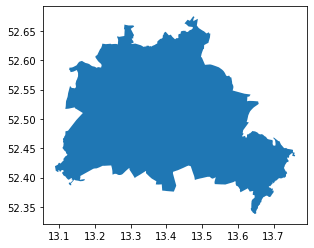

In [10]:
#Show polygon of Berlin
gdf_berlin.plot()

plt.show()

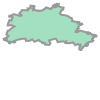

In [11]:
#Extract geometry of Berlin
berlin_geo = gdf_berlin["geometry"].values[0]
berlin_geo

Select POIs in Berlin through the polygon

In [12]:
#create coordinates(Points) of Germany
df_poi_de["Coordinate"] = df_poi_de.apply(lambda x:Point(x["Longitude"], x["Latitude"]), axis=1)

/Users/zzfang/anaconda3/envs/fatcat/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [13]:
df_poi_de.head()

,venue_ID,Latitude,Longitude,Category,Country_Code,Coordinate
20549,4a120aa1f964a5206d771fe3,50.948526,6.943665,Event Space,DE,POINT (6.943664999999999 50.948526)
20587,4a12fc13f964a520aa771fe3,50.947711,6.921073,Gastropub,DE,POINT (6.921073 50.947711)
20665,4a143153f964a52016781fe3,51.035462,7.011976,Department Store,DE,POINT (7.011976 51.035462)
20767,4a15ae1bf964a520b5781fe3,50.936197,6.939741,Restaurant,DE,POINT (6.939741000000001 50.936197)
20851,4a172db1f964a52039791fe3,50.946437,6.945880,Bar,DE,POINT (6.945880000000001 50.946437)


In [14]:
#Test whether the POIs are in Berlin according to their coordinates
df_poi_de["In_Berlin"] = df_poi_de.apply(lambda x:x["Coordinate"].within(berlin_geo), axis=1)

/Users/zzfang/anaconda3/envs/fatcat/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [15]:
df_poi_de.head()

,venue_ID,Latitude,Longitude,Category,Country_Code,Coordinate,In_Berlin
20549,4a120aa1f964a5206d771fe3,50.948526,6.943665,Event Space,DE,POINT (6.943664999999999 50.948526),False
20587,4a12fc13f964a520aa771fe3,50.947711,6.921073,Gastropub,DE,POINT (6.921073 50.947711),False
20665,4a143153f964a52016781fe3,51.035462,7.011976,Department Store,DE,POINT (7.011976 51.035462),False
20767,4a15ae1bf964a520b5781fe3,50.936197,6.939741,Restaurant,DE,POINT (6.939741000000001 50.936197),False
20851,4a172db1f964a52039791fe3,50.946437,6.945880,Bar,DE,POINT (6.945880000000001 50.946437),False


In [16]:
#Select POIs in Berlin
df_berlin = df_poi_de[df_poi_de["In_Berlin"]==True]
df_berlin
df_berlin = df_berlin.reset_index()

# Select Checkin in Berlin

In [17]:
#load check-in data
df_checkin = pd.read_csv(checkin_path, sep='\t', header=None, names=["User","venue_ID","UTC_Time","OFFSET"])
df_checkin.head()

,User,venue_ID,UTC_Time,OFFSET
0,822121,4b4b87b5f964a5204a9f26e3,Tue Apr 03 18:00:07 +0000 2012,180
1,208842,4b4606f2f964a520751426e3,Tue Apr 03 18:00:08 +0000 2012,-300
2,113817,4b4bade2f964a520cfa326e3,Tue Apr 03 18:00:09 +0000 2012,-240
3,14732,4c143cada5eb76b0dc7dc1b7,Tue Apr 03 18:00:09 +0000 2012,-240
4,1397630,4e88cf4ed22d53877981fdab,Tue Apr 03 18:00:09 +0000 2012,-300


In [18]:
#number of check-ins
len(df_checkin)

22809624

In [19]:
#Select check-ins in West Europ(UTC+1 or UTC+2)
df_checkin_we = df_checkin[(df_checkin.OFFSET==60)|(df_checkin.OFFSET==120)]

In [20]:
len(df_checkin_we)

2619483

In [22]:
#filter checkin records in Berlin according to venue ID
venues_we = df_checkin_we.venue_ID.values
venues_berlin = df_berlin.venue_ID.values
set_venues_berlin = set(venues_berlin.tolist())
in_berlin = [venue_i in set_venues_berlin for venue_i in venues_we]
in_berlin = np.array(in_berlin)

df_checkin_we["In_Berlin"] = in_berlin

/Users/zzfang/anaconda3/envs/fatcat/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [23]:
df_checkin_berlin = df_checkin_we[df_checkin_we.In_Berlin==True]

In [24]:
df_checkin_berlin.head(5)

,User,venue_ID,UTC_Time,OFFSET,In_Berlin
221,1009465,4ab5691ef964a520707420e3,Tue Apr 03 18:03:18 +0000 2012,120,True
805,164604,4c7ff4dddc018cfa5a35b86c,Tue Apr 03 18:12:16 +0000 2012,120,True
1384,83194,4bb9ea5298c7ef3b33733202,Tue Apr 03 18:21:25 +0000 2012,120,True
1724,2226,4b06b604f964a520eeee22e3,Tue Apr 03 18:27:24 +0000 2012,120,True
2532,309692,4db9463a0437609120fddb31,Tue Apr 03 18:39:29 +0000 2012,120,True


In [25]:
df_checkin_berlin = df_checkin_berlin.drop(columns=["In_Berlin"])

In [26]:
# add latitude, longitude and category of the venues
venueIDs_checkin_berlin = df_checkin_berlin.venue_ID.values

venue_latitudes = np.array([df_berlin[df_berlin.venue_ID==venueID]["Latitude"].values[0] for venueID in venueIDs_checkin_berlin])

venue_longitudes = np.array([df_berlin[df_berlin.venue_ID==venueID]["Longitude"].values[0] for venueID in venueIDs_checkin_berlin])

venue_categories = np.array([df_berlin[df_berlin.venue_ID==venueID]["Category"].values[0] for venueID in venueIDs_checkin_berlin])

In [27]:
df_checkin_berlin["Latitude"] = venue_latitudes
df_checkin_berlin["Longitude"]= venue_longitudes
df_checkin_berlin["Category"] = venue_categories

In [28]:
#Total number of check-ins in Berlin
len(df_checkin_berlin)

33622

In [31]:
#remove the Moving targets
df_checkin_berlin = df_checkin_berlin[df_checkin_berlin.Category!="Moving Target"]

In [32]:
#check the number of check-in records
len(df_checkin_berlin)

33590

In [35]:
#Number of unique users
len(np.unique(df_checkin_berlin.User.values))

1749

In [36]:
#Number of unique venues
len(np.unique(df_checkin_berlin.venue_ID.values))

7356

In [37]:
#unique POIs of Check-in
df_checkin_berlin_unique = df_checkin_berlin.drop_duplicates(subset=["venue_ID"])
df_checkin_berlin_unique = df_checkin_berlin_unique.drop(columns=["User","UTC_Time","OFFSET"])

In [38]:
df_checkin_berlin_unique.head()

,venue_ID,Latitude,Longitude,Category
221,4ab5691ef964a520707420e3,52.512995,13.419998,Event Space
805,4c7ff4dddc018cfa5a35b86c,52.477553,13.454981,Home (private)
1384,4bb9ea5298c7ef3b33733202,52.516631,13.448827,Greek Restaurant
1724,4b06b604f964a520eeee22e3,52.547036,13.416652,Sports Bar
2532,4db9463a0437609120fddb31,52.527799,13.386519,Japanese Restaurant


In [40]:
#visualization of POIs
berlin_centre = Point(13.404954,52.520008)
m = folium.Map(location=[berlin_centre.y,berlin_centre.x])
for i in range(len(df_checkin_berlin_unique)):
    latitude = df_checkin_berlin_unique.iloc[i]["Latitude"]
    longitude = df_checkin_berlin_unique.iloc[i]["Longitude"]
    category = df_checkin_berlin_unique.iloc[i]["Category"]
    location = (latitude,longitude)
    folium.Marker(location, popup=category+' '+str(location)).add_to(m)
m

Clustering of POIs

In [41]:
# define the number of kilometers in one radian
kms_per_radian = 6371.0088

In [42]:
# represent points consistently as (lat, lon)
#coords = df.as_matrix(columns=['lat', 'lon'])
coords_berlin = df_checkin_berlin_unique[["Latitude","Longitude"]].to_numpy()
# define epsilon as 0.084 kilometers(walking distance within 1 min), converted to radians for use by haversine
epsilon = 0.08 / kms_per_radian

In [43]:
start_time = time.time()
db = DBSCAN(eps=epsilon, min_samples=1, algorithm='auto', metric='haversine').fit(np.radians(coords_berlin))
cluster_labels = db.labels_

# get the number of clusters
num_clusters = len(set(cluster_labels))

# all done, print the outcome
message = 'Clustered {:,} points down to {:,} clusters, for {:.1f}% compression in {:,.2f} seconds'
print(message.format(len(df_checkin_berlin_unique), 
                     num_clusters, 100*(1 - float(num_clusters) / len(df_checkin_berlin_unique)), 
                     time.time()-start_time))
print('Silhouette coefficient: {:0.03f}'.format(metrics.silhouette_score(coords_berlin, cluster_labels)))

Clustered 7,356 points down to 2,608 clusters, for 64.5% compression in 0.92 seconds
Silhouette coefficient: 0.114


In [46]:
#add cluster number to the POIs
df_checkin_berlin_unique["Num_Cluster"]=cluster_labels

In [47]:
df_checkin_berlin_unique.head()

,venue_ID,Latitude,Longitude,Category,Num_Cluster
221,4ab5691ef964a520707420e3,52.512995,13.419998,Event Space,0
805,4c7ff4dddc018cfa5a35b86c,52.477553,13.454981,Home (private),1
1384,4bb9ea5298c7ef3b33733202,52.516631,13.448827,Greek Restaurant,2
1724,4b06b604f964a520eeee22e3,52.547036,13.416652,Sports Bar,3
2532,4db9463a0437609120fddb31,52.527799,13.386519,Japanese Restaurant,4


In [48]:
#Compute coordinates of Centroids of the clusters
unique_cluster_labels = np.unique(cluster_labels)
unique_cluster_labels = np.array(sorted(unique_cluster_labels))
centroids_berlin = []
for cluster_label in unique_cluster_labels:
    df_checkin_berlin_unique_cluster = df_checkin_berlin_unique[df_checkin_berlin_unique["Num_Cluster"]==cluster_label]
    latitudes = df_checkin_berlin_unique_cluster.Latitude.values
    longitudes = df_checkin_berlin_unique_cluster.Longitude.values
    c_latitude = np.mean(latitudes)
    c_longitude = np.mean(longitudes)
    centroid = (c_longitude, c_latitude)
    centroids_berlin.append(centroid)

In [50]:
#unique_cluster_labels = np.array(sorted(unique_cluster_labels))
unique_cluster_labels

array([   0,    1,    2, ..., 2605, 2606, 2607])

In [51]:
#Store the centroids of Berlin
centroids_berlin_lon = np.array([p[0] for p in centroids_berlin])
centroids_berlin_lat = np.array([p[1] for p in centroids_berlin])
df_centroids_berlin = pd.DataFrame()
df_centroids_berlin["Centroid_ID"] = unique_cluster_labels
df_centroids_berlin["Longitude"] = centroids_berlin_lon
df_centroids_berlin["Latitude"] = centroids_berlin_lat

In [52]:
df_centroids_berlin.head()

,Centroid_ID,Longitude,Latitude
0,0,13.420105,52.512959
1,1,13.454981,52.477553
2,2,13.449665,52.516823
3,3,13.416853,52.546727
4,4,13.388138,52.527635


In [53]:
#Store the data
df_centroids_berlin.to_csv("./centroids_berlin.tsv", sep='\t',index=False)

In [54]:
#Add centroid coordinate to the data
def find_clatitude(row):
    c_label = row["Num_Cluster"]
    return centroids_berlin[c_label][1]

df_checkin_berlin_unique["C_Latitude"] = df_checkin_berlin_unique.apply(find_clatitude, axis=1)

In [55]:
def find_clongitude(row):
    c_label = row["Num_Cluster"]
    return centroids_berlin[c_label][0]

df_checkin_berlin_unique["C_Longitude"] = df_checkin_berlin_unique.apply(find_clongitude,axis=1)

In [56]:
df_checkin_berlin_unique.head(5)

,venue_ID,Latitude,Longitude,Category,Num_Cluster,C_Latitude,C_Longitude
221,4ab5691ef964a520707420e3,52.512995,13.419998,Event Space,0,52.512959,13.420105
805,4c7ff4dddc018cfa5a35b86c,52.477553,13.454981,Home (private),1,52.477553,13.454981
1384,4bb9ea5298c7ef3b33733202,52.516631,13.448827,Greek Restaurant,2,52.516823,13.449665
1724,4b06b604f964a520eeee22e3,52.547036,13.416652,Sports Bar,3,52.546727,13.416853
2532,4db9463a0437609120fddb31,52.527799,13.386519,Japanese Restaurant,4,52.527635,13.388138


In [57]:
#Visualization of Centroids of clusters
m_centroids = folium.Map(location=[berlin_centre.y,berlin_centre.x])
for i in range(len(centroids_berlin)):
    latitude = centroids_berlin[i][1]
    longitude = centroids_berlin[i][0]
    location = (latitude,longitude)
    folium.Marker(location,popup=str(location),
                  icon=folium.Icon(color="orange")).add_to(m_centroids)
m_centroids

In [58]:
#Save the data
df_checkin_berlin_unique.to_csv("./checkin_berlin_unique.tsv",sep='\t',index=False)

In [60]:
df_checkin_berlin.head()

,User,venue_ID,UTC_Time,OFFSET,Latitude,Longitude,Category
221,1009465,4ab5691ef964a520707420e3,Tue Apr 03 18:03:18 +0000 2012,120,52.512995,13.419998,Event Space
805,164604,4c7ff4dddc018cfa5a35b86c,Tue Apr 03 18:12:16 +0000 2012,120,52.477553,13.454981,Home (private)
1384,83194,4bb9ea5298c7ef3b33733202,Tue Apr 03 18:21:25 +0000 2012,120,52.516631,13.448827,Greek Restaurant
1724,2226,4b06b604f964a520eeee22e3,Tue Apr 03 18:27:24 +0000 2012,120,52.547036,13.416652,Sports Bar
2532,309692,4db9463a0437609120fddb31,Tue Apr 03 18:39:29 +0000 2012,120,52.527799,13.386519,Japanese Restaurant


In [61]:
#Add Centroid information to checkin records
def add_numCluster(row):
    venue_id = row["venue_ID"]
    num_cluster = df_checkin_berlin_unique[df_checkin_berlin_unique["venue_ID"]==venue_id]["Num_Cluster"].values[0]
    return num_cluster

df_checkin_berlin["Num_Cluster"]=df_checkin_berlin.apply(add_numCluster,axis=1)

In [64]:
df_checkin_berlin.head(5)

,User,venue_ID,UTC_Time,OFFSET,Latitude,Longitude,Category,Num_Cluster
221,1009465,4ab5691ef964a520707420e3,Tue Apr 03 18:03:18 +0000 2012,120,52.512995,13.419998,Event Space,0
805,164604,4c7ff4dddc018cfa5a35b86c,Tue Apr 03 18:12:16 +0000 2012,120,52.477553,13.454981,Home (private),1
1384,83194,4bb9ea5298c7ef3b33733202,Tue Apr 03 18:21:25 +0000 2012,120,52.516631,13.448827,Greek Restaurant,2
1724,2226,4b06b604f964a520eeee22e3,Tue Apr 03 18:27:24 +0000 2012,120,52.547036,13.416652,Sports Bar,3
2532,309692,4db9463a0437609120fddb31,Tue Apr 03 18:39:29 +0000 2012,120,52.527799,13.386519,Japanese Restaurant,4


In [65]:
#check checkin records of one user
df_checkin_berlin[df_checkin_berlin["User"]==1009465]

,User,venue_ID,UTC_Time,OFFSET,Latitude,Longitude,Category,Num_Cluster
221,1009465,4ab5691ef964a520707420e3,Tue Apr 03 18:03:18 +0000 2012,120,52.512995,13.419998,Event Space,0
103424,1009465,4e67ad1aa8098026756dc6d6,Wed Apr 04 17:14:16 +0000 2012,120,52.509406,13.400474,Office,64
608678,1009465,4adcda91f964a520bc4b21e3,Thu Apr 12 11:17:46 +0000 2012,120,52.510397,13.434756,Train Station,27
612257,1009465,4ca2b0e15720b1f724b22bef,Thu Apr 12 11:47:47 +0000 2012,120,52.510804,13.435340,Light Rail,27
1009635,1009465,4adcda91f964a520bc4b21e3,Mon Apr 16 15:25:16 +0000 2012,120,52.510397,13.434756,Train Station,27
...,...,...,...,...,...,...,...,...
22651651,1009465,4e67ad1aa8098026756dc6d6,Tue Jan 14 18:40:57 +0000 2014,60,52.509406,13.400474,Office,64
22737425,1009465,5135ceb6e4b080cc1547ed3e,Fri Jan 24 14:57:00 +0000 2014,60,52.526367,13.400231,Coworking Space,10
22771333,1009465,5093cad6e4b0ad3a947de099,Mon Jan 27 08:58:19 +0000 2014,60,52.497240,13.361890,Restaurant,488
22772260,1009465,4f9596e3e4b0949d2264cca4,Mon Jan 27 10:31:47 +0000 2014,60,52.525774,13.407091,Building,10


In [66]:
#Save the checkin records including Centroid information
df_checkin_berlin.to_csv("./checkin_berlin.tsv",sep='\t',index=False)

# Exploring Tram & Metro Stations Data

In [3]:
# load tram(Sbahn) data
gdf_tram_stops = gpd.read_file("./data/sbahn.geojson")

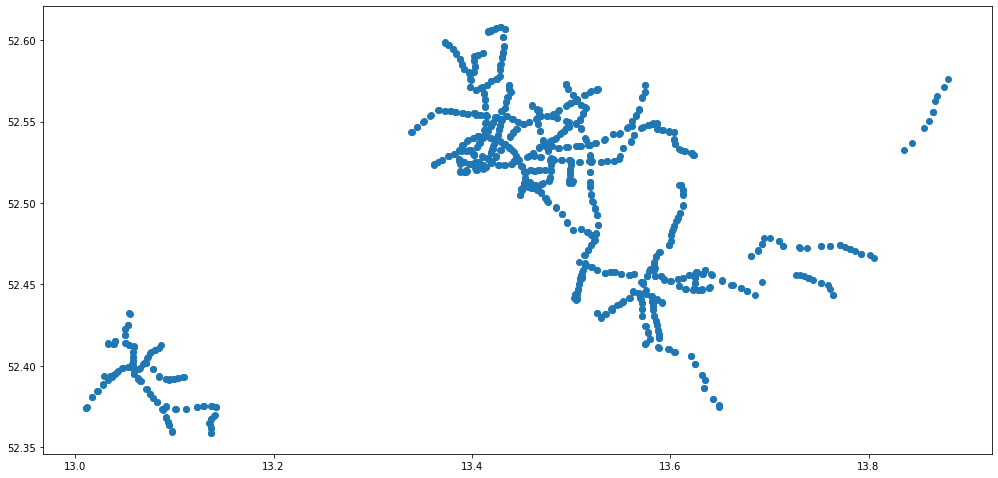

In [4]:
#plot distribution of tram stops
gdf_tram_stops.plot(figsize=(17,17))
plt.show()

In [5]:
# load metro(U-Bahn) data
gdf_metro_stops = gpd.read_file("./data/ubahn.geojson")

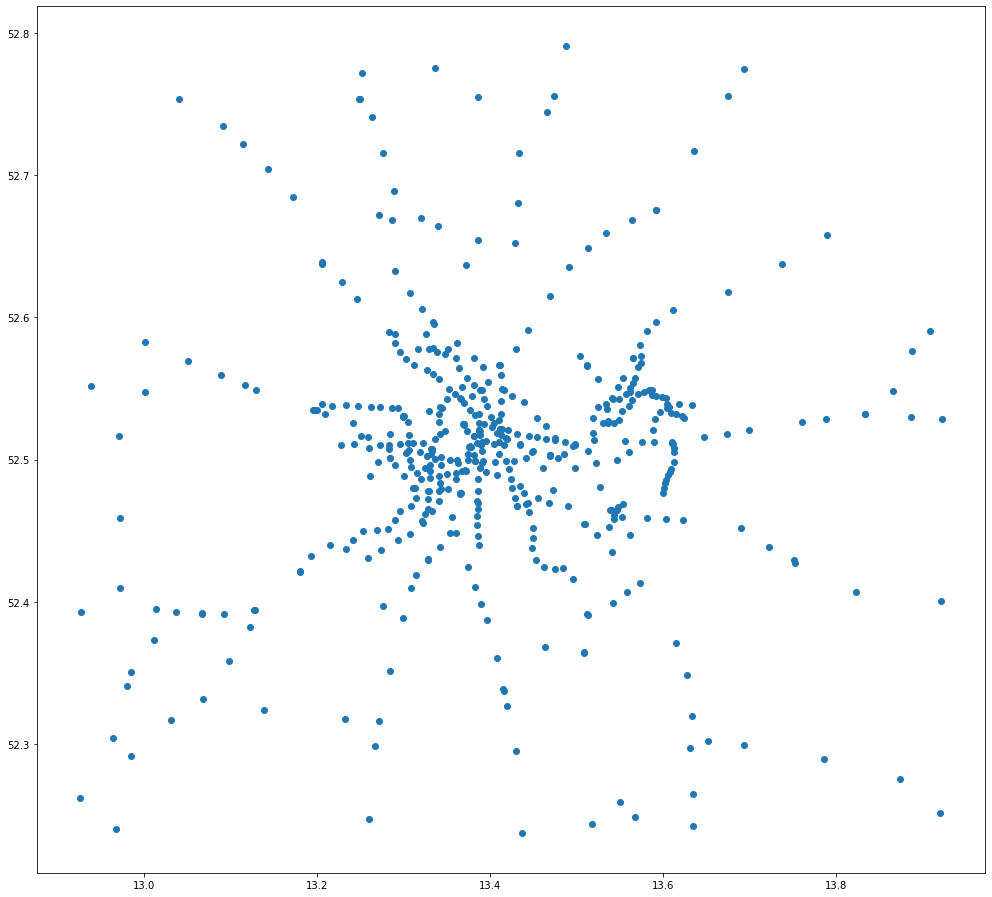

In [6]:
# distribution of u-bahn stops
gdf_metro_stops.plot(figsize=(17,17))
plt.show()

In [8]:
#combine metro stops with tram stops
lightrail_points = list(gdf_tram_stops.geometry.values)+list(gdf_metro_stops.geometry.values)
lightrail_names = np.concatenate([gdf_tram_stops.name.values, gdf_metro_stops.name.values])
points_num = np.arange(len(lightrail_names))
gdf_lightrail = gpd.GeoDataFrame()
gdf_lightrail["points_num"] = points_num
gdf_lightrail["name"] = lightrail_names
gdf_lightrail["geometry"] = lightrail_points

In [9]:
gdf_lightrail.head()

,points_num,name,geometry
0,0,Regattastraße/Sportpromenade,POINT (13.59831 52.41043)
1,1,Seestraße/Amrumer Straße,POINT (13.34490 52.54671)
2,2,Schönhauser Allee/Bornholmer Straße,POINT (13.41389 52.55377)
3,3,Björnsonstraße,POINT (13.40264 52.55530)
4,4,Schönhauser Allee/Bornholmer Straße,POINT (13.41449 52.55420)


In [11]:
berlin_centre = (52.520008, 13.404954)

#visualizing lightrail stops
lightrail_stops = gdf_lightrail.geometry.values
lightrail_names = gdf_lightrail.name.values
m_lightrail_stops = folium.Map(location= berlin_centre)
for i in range(len(lightrail_names)):
    name = lightrail_names[i]
    location = (lightrail_stops[i].y,lightrail_stops[i].x)
    folium.Marker(location, popup=name,icon=folium.Icon(color='green')).add_to(m_lightrail_stops)
m_lightrail_stops

In [124]:
m_lightrail_stops.save("stops_lightrail.html")

In [12]:
gdf_lightrail.to_file("stops_of_lightrail.geojson", index=False, driver='GeoJSON')

## Project Centroids to Lightrail Points
Find nearest lighrail stop to the centroids

In [25]:
#load data
gdf_lightrail = gpd.read_file("./result/stops_of_lightrail.geojson")
df_centroids_berlin = pd.read_csv("./result/centroids_berlin.tsv", sep='\t')

In [38]:
points_lightrail = gdf_lightrail["geometry"].values
points_id = gdf_lightrail["points_num"].values

In [27]:
#  extract coords of stops
points_lightrail_coords = [(p.x, p.y) for p in points_lightrail]
#points_lightrail_lats = np.array([p.y for p in points_lightrail])
#points_lightrail_lons = np.array([p.x for p in points_lightrail])

In [35]:
#Extract centroids and the corresponding coordinates
centroids = df_centroids_berlin["Centroid_ID"].values
lons_centroid = df_centroids_berlin["Longitude"].values
lats_centroid = df_centroids_berlin["Latitude"].values
coords_centroid = list(zip(lons_centroid, lats_centroid))

In [39]:
#Find nearest lightrail stop to the centroid and the corresponding (haversine) distance
nearst_lightrail_points = []
distances_lightrail = []
for centroid in centroids:
    centroid_coord = coords_centroid[centroid]
    min_hdistance = haversine(centroid_coord, points_lightrail_coords[0])
    nearst_lightrail_point = points_lightrail_coords[0]
    for point_id in points_id:
        point_coordinate = points_lightrail_coords[point_id]
        hdistance = haversine(centroid_coord, point_coordinate)
        if hdistance<min_hdistance:
            min_hdistance = hdistance
            nearst_lightrail_point = point_coordinate
    nearst_lightrail_points.append(nearst_lightrail_point)
    distances_lightrail.append(min_hdistance)

In [48]:
#extract lons and lata
nearst_lons = np.array([s[0] for s in nearst_lightrail_points])
nearst_lats = np.array([s[1] for s in nearst_lightrail_points])

In [51]:
df_centroids_berlin["NearLightlon"] = nearst_lons
df_centroids_berlin["NearLightLat"] = nearst_lats
df_centroids_berlin["DistanceStop"] = np.array(distances_lightrail)

In [52]:
df_centroids_berlin.head()

,Centroid_ID,Longitude,Latitude,NearLightlon,NearLightLat,DistanceStop
0,0,13.420105,52.512959,13.419493,52.514215,0.151926
1,1,13.454981,52.477553,13.455690,52.472981,0.500701
2,2,13.449665,52.516822,13.452526,52.519215,0.410058
3,3,13.416853,52.546727,13.418962,52.547136,0.238701
4,4,13.388138,52.527635,13.386972,52.527350,0.133281


In [53]:
df_centroids_berlin.to_csv("centroids_berlin_stops.tsv", sep='\t',index=False)